**Histogram processing(left,right shift , Contrast Stretching , Sliding)DFT,Negative,Image thresholding,bluring,Sharpening,smothening use histogram to visualize the effects**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import seaborn as sns
import gdown
import os

In [ ]:
def read_img(url):
    file_id = url.split("/d/")[1].split("/")[0]
    download_url = f'https://drive.google.com/uc?id={file_id}'

    gdown.download(download_url,"img.jpg", quiet=False)

    return cv2.imread("img.jpg",cv2.IMREAD_GRAYSCALE)

In [ ]:
def img_details(name,img,shape = None , i = None , cmap=None,show = 1):
    if shape and i is not None:
        plt.subplot(shape[0],shape[1],i)
        show = None
    if cmap is None:
       plt.imshow(img)
    else:
       plt.imshow(img,cmap=cmap)
    plt.title(f'{name}{img.shape}')

    if show is not None:
        plt.show()

    plt.tight_layout()

In [ ]:
def plot_histogram(img, title, pos, s):
    plt.subplot(s[0], s[1], pos)
    plt.hist(img.ravel(), bins=256, range=[0, 256], color='black', alpha=0.7)
    plt.title(title)

**READ THE IMAGE**

In [ ]:
img1 = read_img(r"https://drive.google.com/file/d/1IR-TdzKfzvEsWIcWbFjEewGkiGYe_WOi/view?usp=drive_link")
img2 = read_img(r"https://drive.google.com/file/d/1aRkiHJ2Q7T9TnowHchLB1R9lj4BFrQCK/view?usp=drive_link")

Downloading...
From: https://drive.google.com/uc?id=1IR-TdzKfzvEsWIcWbFjEewGkiGYe_WOi
To: /content/img.jpg
100%|██████████| 245k/245k [00:00<00:00, 70.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=1aRkiHJ2Q7T9TnowHchLB1R9lj4BFrQCK
To: /content/img.jpg
100%|██████████| 38.8k/38.8k [00:00<00:00, 36.9MB/s]


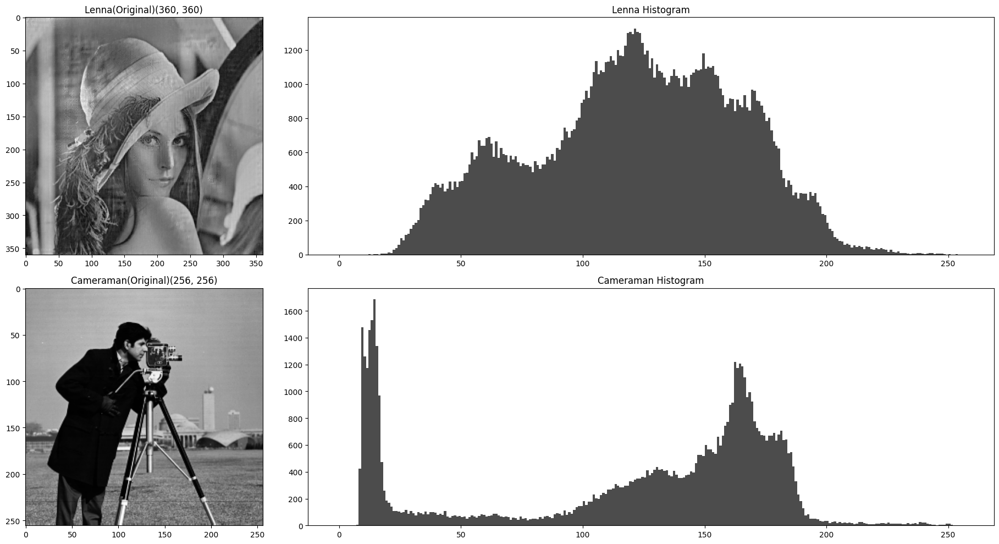

In [ ]:
def print_original_img_and_histogram():
    s = (2,2)
    plt.figure(figsize=(22,10))


    img_details('Lenna(Original)', img1, s, 1,cmap='gray')
    plot_histogram(img1, 'Lenna Histogram', 2, s)

    img_details('Cameraman(Original)', img2, s, 3, cmap='gray')
    plot_histogram(img2, 'Cameraman Histogram', 4, s)

    plt.tight_layout()
    plt.show()

print_original_img_and_histogram()

**BLURING**

In [ ]:
def blurring(img,kernel_size,border):
    return cv2.GaussianBlur(img,kernel_size,0,borderType=border)

In [ ]:
def print_blur_img(k_s,border=cv2.BORDER_DEFAULT):
    s = (2,2)
    plt.figure(figsize=(20,10))
    img1_blur = blurring(img1,k_s,border)
    img2_blur = blurring(img2,k_s,border)

    img_details(f'Lenna(Blurred) kernel size = {k_s} ', img1_blur ,s,1,cmap='gray')
    plot_histogram(img1_blur, 'Lenna Histogram', 2, s)

    img_details(f'Cameraman(Blurred) kernel size = {k_s} ', img2_blur ,s,3,cmap='gray')
    plot_histogram(img2_blur, 'Cameraman Histogram', 4, s)
    plt.tight_layout()

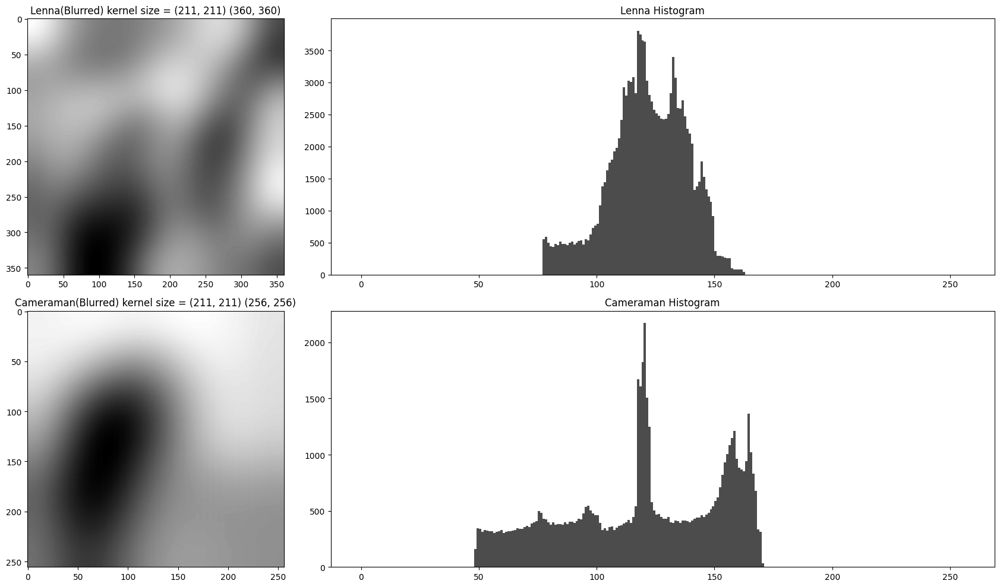

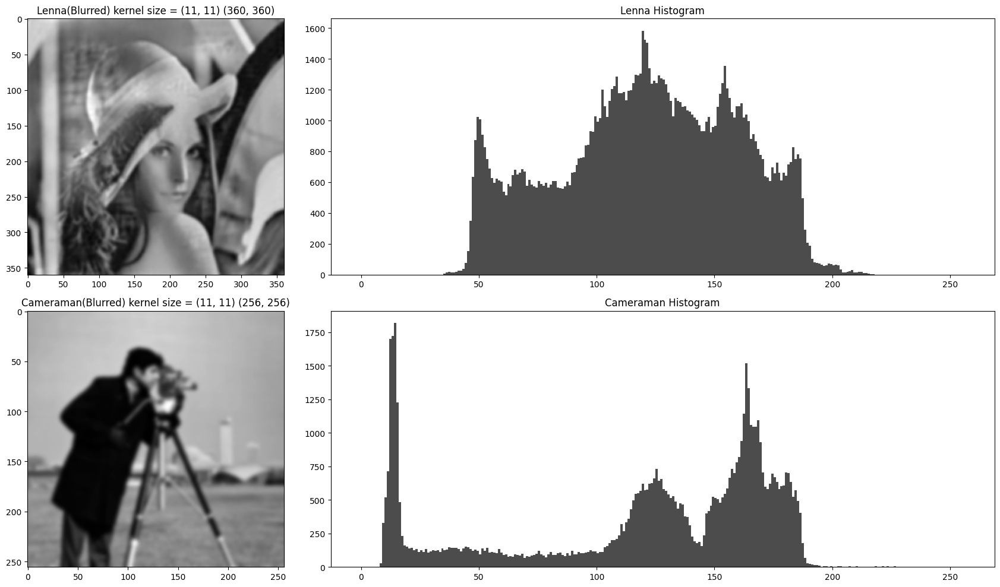

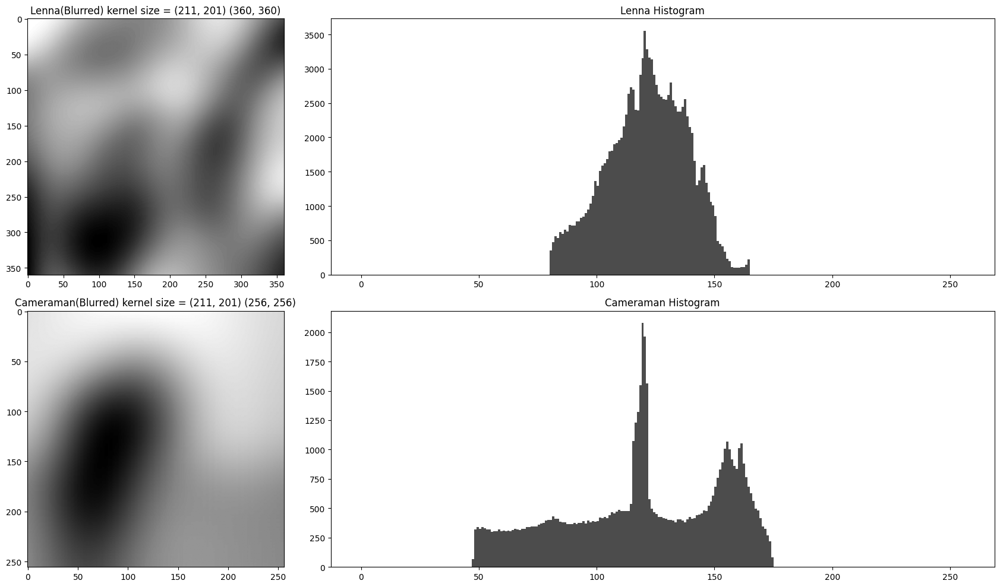

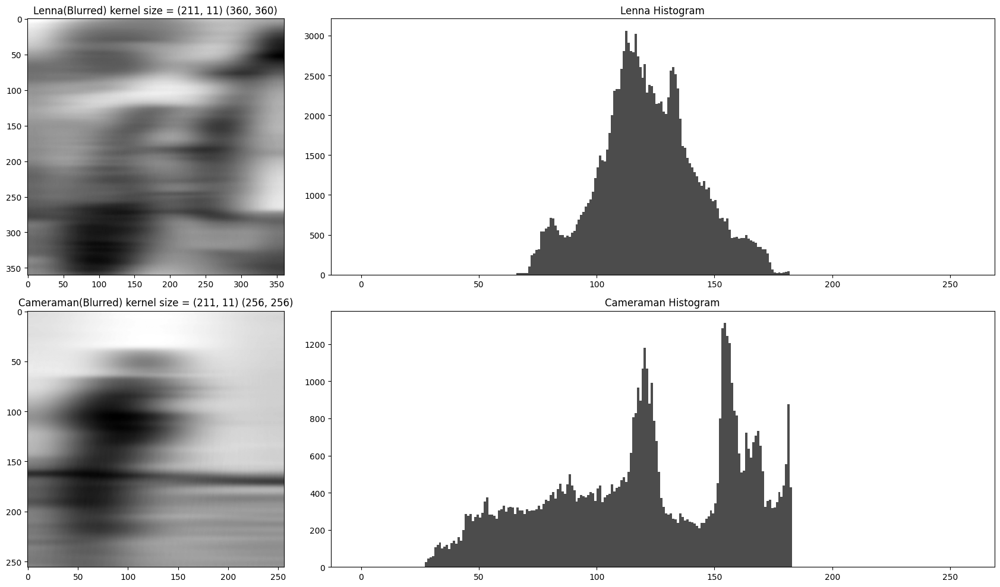

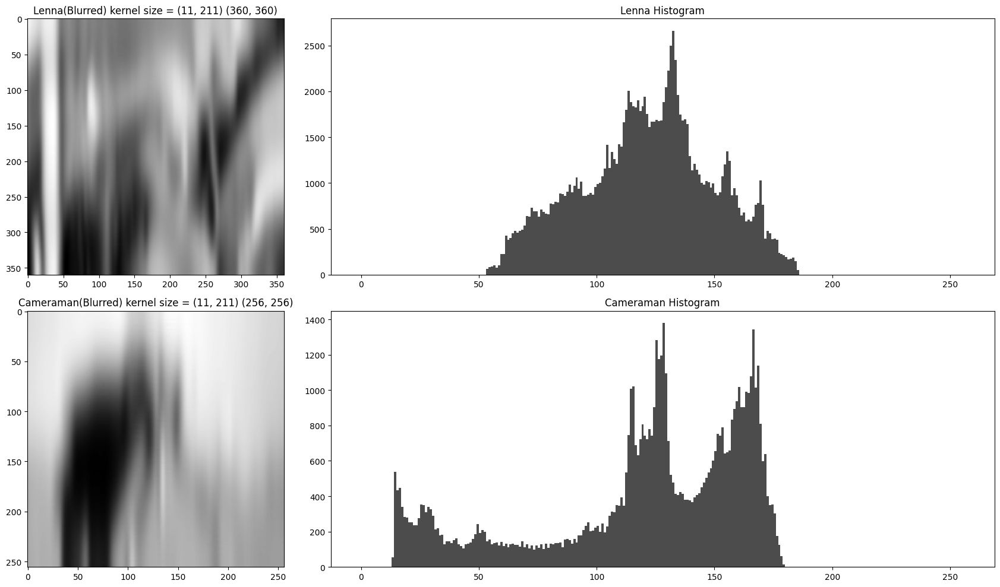

In [ ]:
print_blur_img( (211,211) , border=cv2.BORDER_DEFAULT)
print_blur_img( (11,11) , border=cv2.BORDER_REFLECT)
print_blur_img( (211,201) , border=cv2.BORDER_REPLICATE  )
print_blur_img( (211,11) )
print_blur_img( (11,211) )

plt.show()

**SHARPENING**

In [ ]:
def sharpening(img, kernel=None, anchor=(-1, -1), delta=0, borderType=cv2.BORDER_DEFAULT, equalize_hist=True):

    if kernel is None:
        kernel = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])

    sharp = cv2.filter2D(img, -1, kernel)
    sharp = np.clip(sharp,0,255)

    return sharp

In [ ]:
def print_sharp_img(kernel=None, anchor=(-1, -1), delta=0, borderType=cv2.BORDER_DEFAULT):
    s = (2, 2)
    plt.figure(figsize=(22, 10))

    sharp1 = sharpening(img1, kernel, anchor, delta, borderType)
    sharp2 = sharpening(img2, kernel, anchor, delta, borderType)

    img_details(f'Lenna(Sharpened) anchor={anchor}, delta={delta}', sharp1, s, 1, cmap='gray')
    plot_histogram(sharp1 , 'Lenna Histogram (Sharpened)', 2, s)

    img_details(f'Cameraman(Sharpened) anchor={anchor}, delta={delta}', sharp2, s, 3, cmap='gray')
    plot_histogram(sharp2, 'Cameraman Histogram (Sharpened)', 4, s)

    plt.tight_layout()

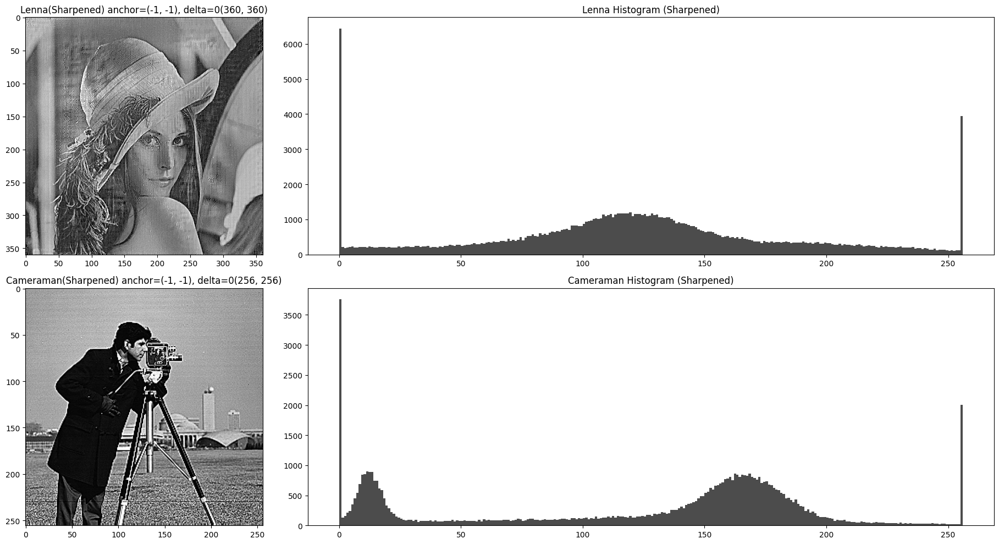

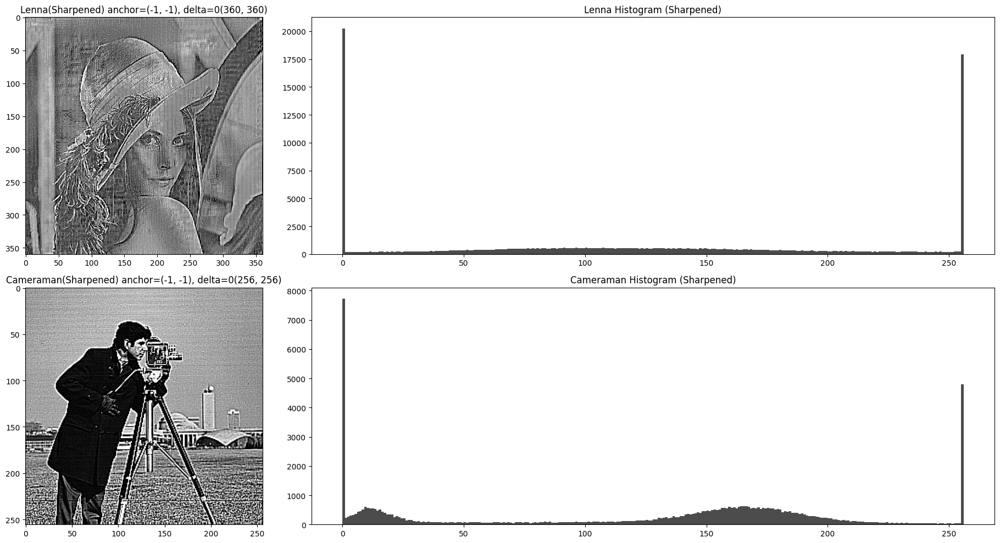

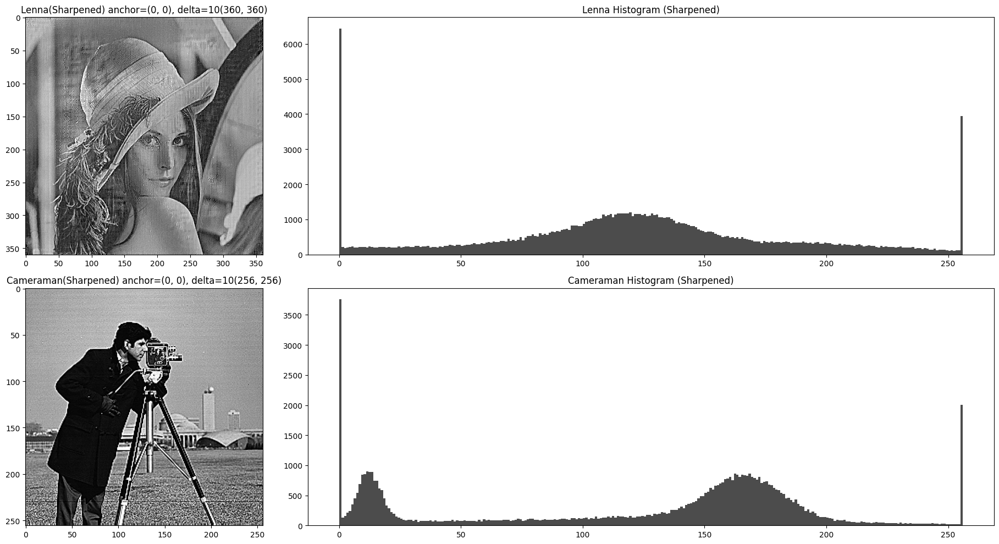

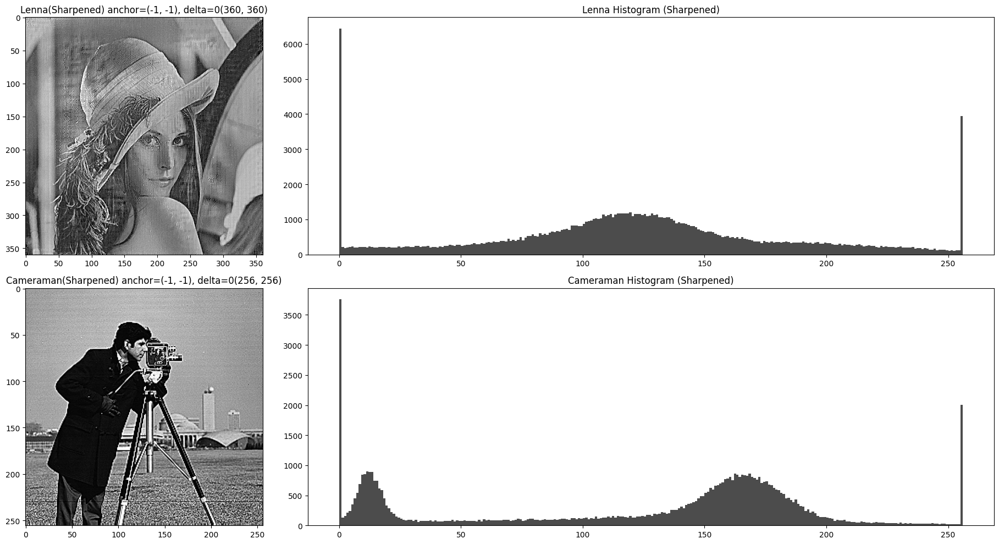

In [ ]:
print_sharp_img()
print_sharp_img(kernel=np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]]))
print_sharp_img(anchor=(0, 0), delta=10)
print_sharp_img(borderType=cv2.BORDER_REFLECT)

**SMOOTHENING**

In [ ]:
def smoothening(img, d=9, sigmaColor=75, sigmaSpace=75, borderType=cv2.BORDER_DEFAULT):

    smooth = cv2.bilateralFilter(img, d, sigmaColor, sigmaSpace, borderType=borderType)
    smooth = np.clip(smooth, 0, 255)

    return smooth

In [ ]:
def print_smooth_img_and_histogram(d=9, sigmaColor=75, sigmaSpace=75, borderType=cv2.BORDER_DEFAULT):
    s = (2, 2)
    plt.figure(figsize=(22, 10))

    smooth1 = smoothening(img1, d, sigmaColor, sigmaSpace, borderType)
    smooth2 = smoothening(img2, d, sigmaColor, sigmaSpace, borderType)

    img_details(f'Lenna(Smoothed) d={d}, sigmaColor={sigmaColor}, sigmaSpace={sigmaSpace}', smooth1, s, 1, cmap='gray')
    plot_histogram(smooth1, f'Lenna Histogram (Smoothed) d={d}, sigmaColor={sigmaColor}, sigmaSpace={sigmaSpace}', 2, s)

    img_details(f'Cameraman(Smoothed) d={d}, sigmaColor={sigmaColor}, sigmaSpace={sigmaSpace}', smooth2, s, 3, cmap='gray')
    plot_histogram(smooth2, f'Cameraman Histogram (Smoothed) d={d}, sigmaColor={sigmaColor}, sigmaSpace={sigmaSpace}', 4, s)

    plt.tight_layout()
    plt.show()

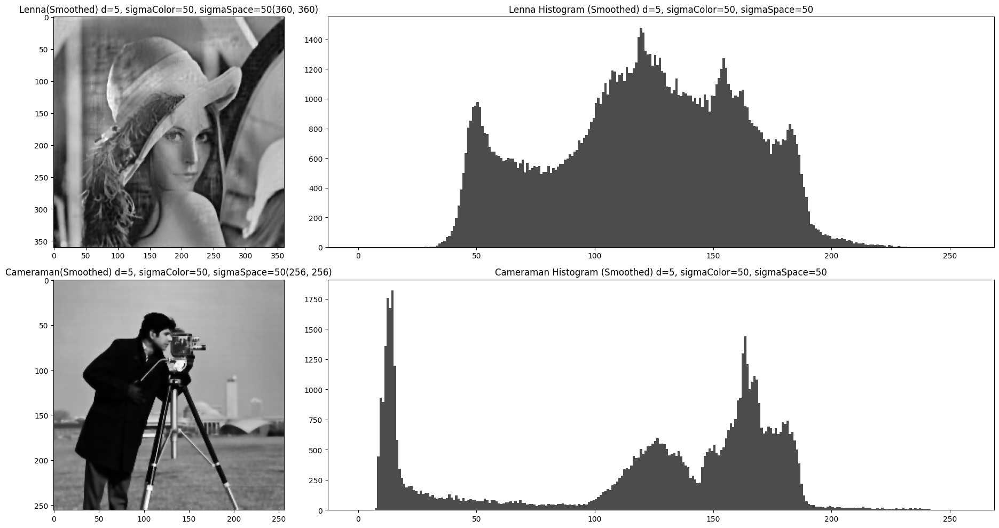

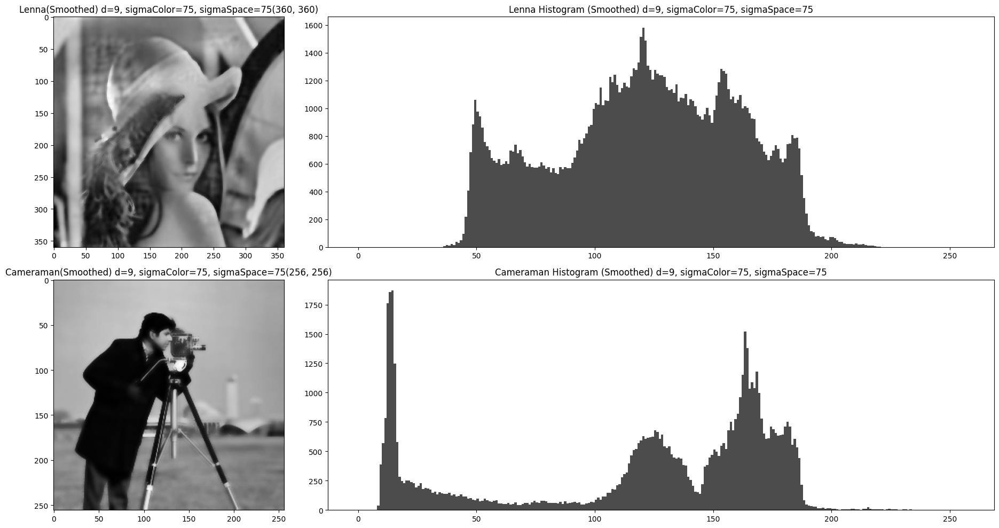

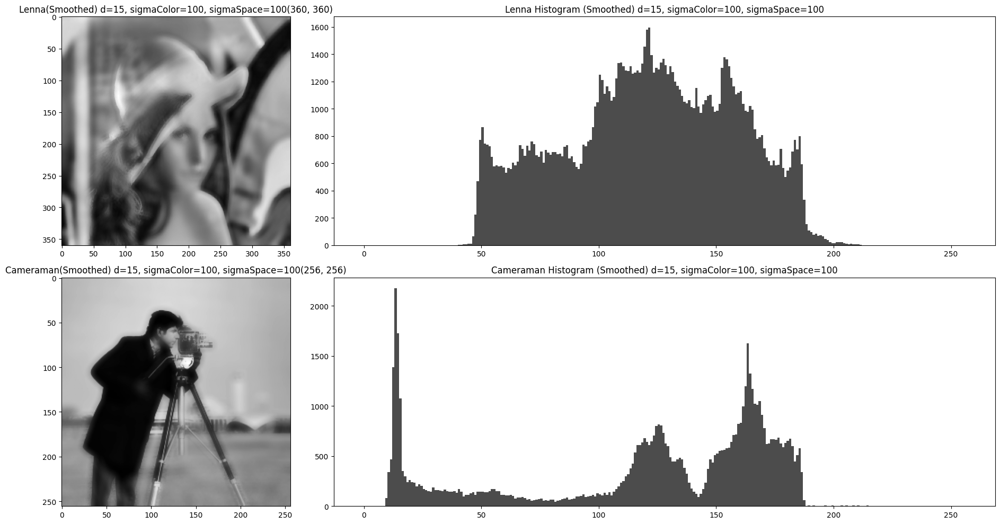

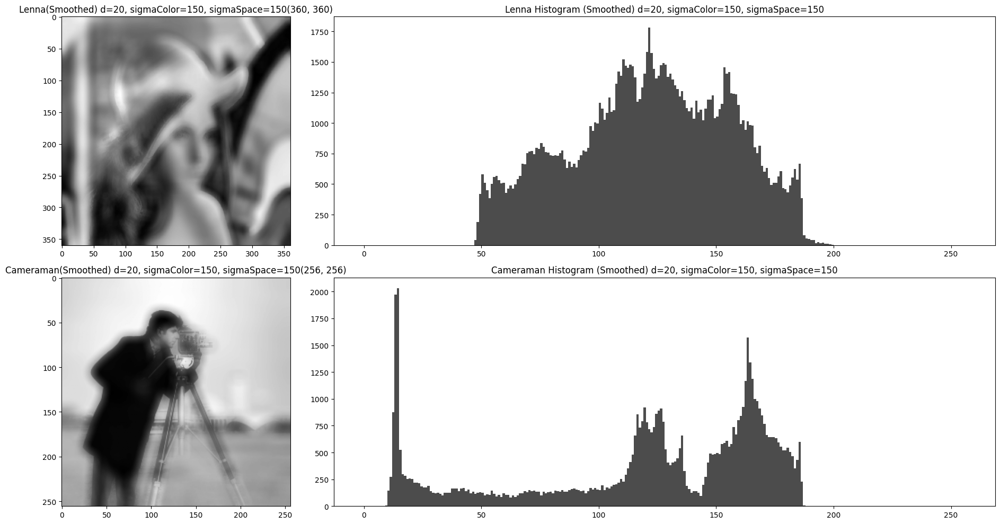

In [ ]:
print_smooth_img_and_histogram(d=5, sigmaColor=50, sigmaSpace=50)
print_smooth_img_and_histogram(d=9, sigmaColor=75, sigmaSpace=75)
print_smooth_img_and_histogram(d=15, sigmaColor=100, sigmaSpace=100)
print_smooth_img_and_histogram(d=20, sigmaColor=150, sigmaSpace=150)

**NEGATIVE**

In [ ]:
def negative(img):
    if img.max() <= 1.0:
        img = (img * 255).astype(np.uint8)
    return np.clip(255 - img, 0, 255).astype(np.uint8)

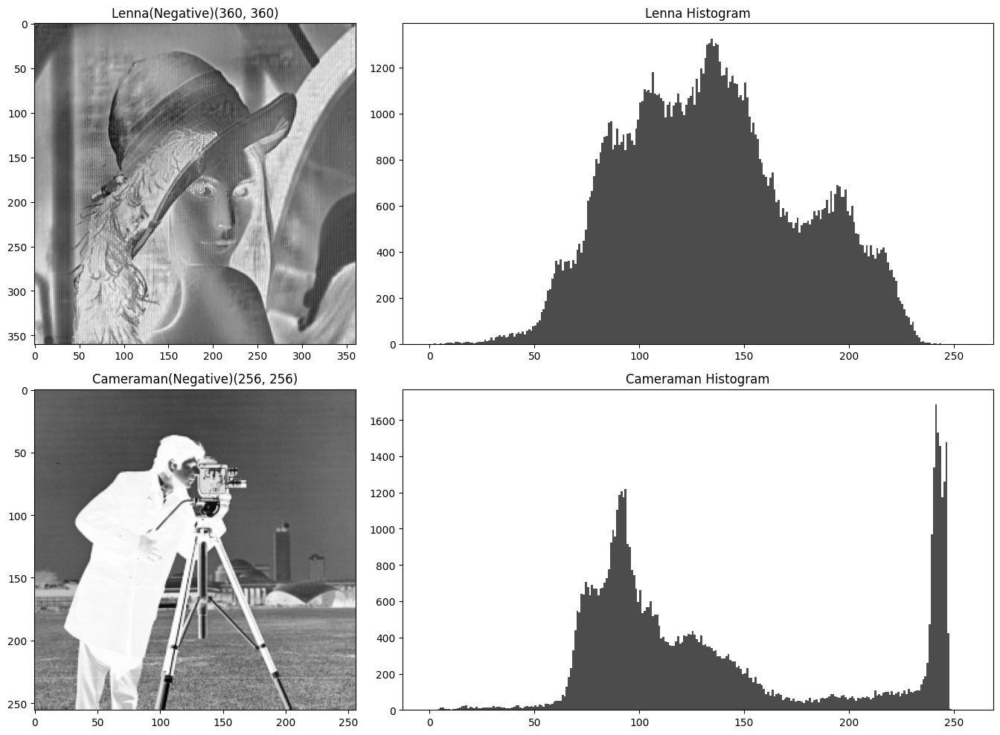

In [ ]:
def print_negative_img():
    s = (2,2)
    plt.figure(figsize=(15,10))

    negative1 = negative(img1)
    negative2 = negative(img2)

    img_details('Lenna(Negative)', negative1, s, 1,cmap='gray')
    img_details('Cameraman(Negative)', negative2, s, 3,cmap='gray')

    plot_histogram(negative1, 'Lenna Histogram', 2, s)
    plot_histogram(negative2, 'Cameraman Histogram',4, s)

    plt.tight_layout()
    plt.show()

print_negative_img()

**IMAGE THRESHOLDING**

In [ ]:
def thresholding(img, threshold_value=150):
    _, thresh_img = cv2.threshold(img, threshold_value, 255, cv2.THRESH_BINARY)
    return thresh_img

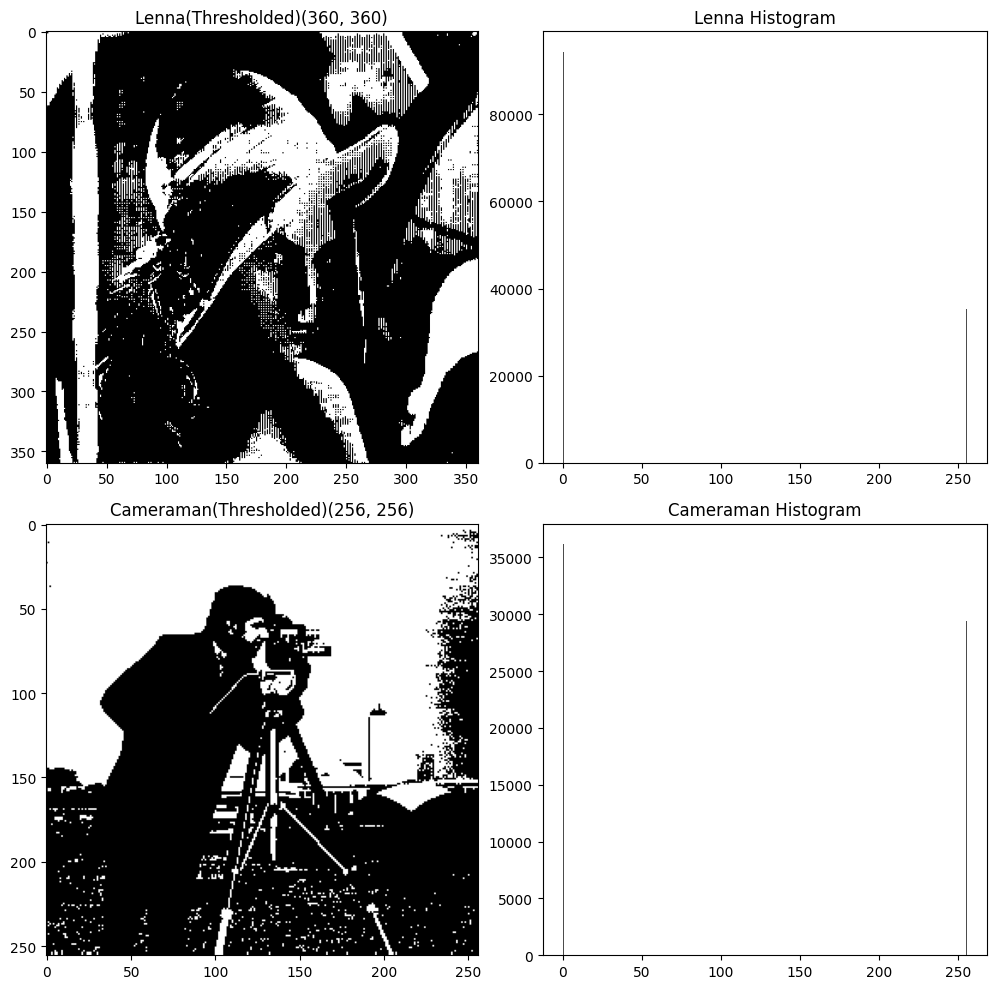

In [ ]:
def print_threshold_img():
    s = (2,2)
    plt.figure(figsize=(10,10))

    thresh1 = thresholding(img1)
    thresh2 = thresholding(img2)

    img_details('Lenna(Thresholded)', thresh1, s, 1,cmap='gray')
    img_details('Cameraman(Thresholded)', thresh2, s, 3,cmap='gray')

    plot_histogram(thresh1, 'Lenna Histogram', 2, s)
    plot_histogram(thresh2, 'Cameraman Histogram', 4, s)

    plt.tight_layout()
    plt.show()

print_threshold_img()

**DFT**

In [ ]:
def dft_transform(img):

    img = img.astype(np.float32)
    if len(img.shape) == 3:
        img = cv2.cvtColor( img , cv2.COLOR_BGR2GRAY)

    dft = cv2.dft(img, flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = cv2.magnitude(dft_shift[:,:,0], dft_shift[:,:,1])

    magnitude_spectrum = np.log(magnitude_spectrum + 1)
    return magnitude_spectrum

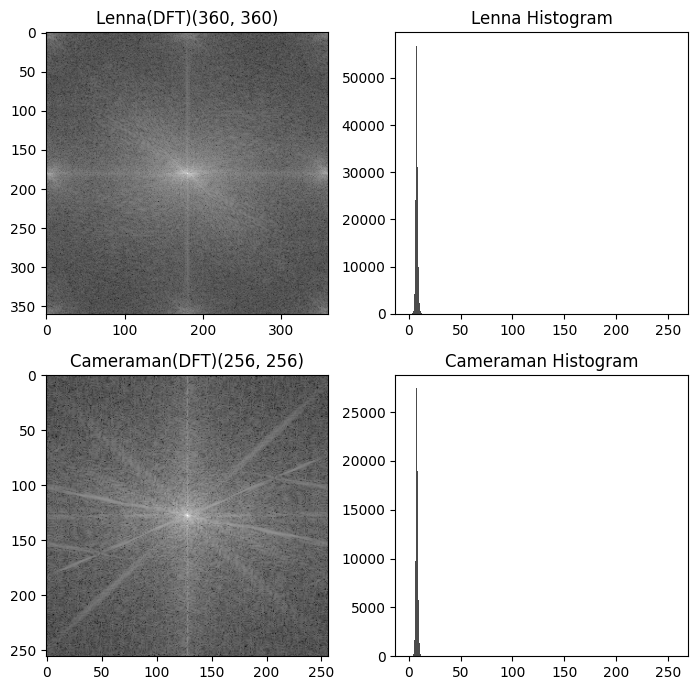

In [ ]:
def print_dft_img():
    s = (2,2)
    plt.figure(figsize=(7,7))

    dft1 = dft_transform(img1)
    dft2 = dft_transform(img2)

    img_details('Lenna(DFT)', dft1, s, 1,cmap='gray')
    img_details('Cameraman(DFT)', dft2, s, 3, cmap='gray')

    plot_histogram(dft1, 'Lenna Histogram', 2, s)
    plot_histogram(dft2, 'Cameraman Histogram', 4, s)

    plt.tight_layout()
    plt.show()

print_dft_img()

**HISTOGRAM PROCESSING**

In [ ]:
def contrast_stretching(img, min_out=0, max_out=255):
    min_in = np.min(img).astype(np.float32)
    max_in = np.max(img).astype(np.float32)

    denominator = max_in - min_in + 1e-6
    stretched = ((img - min_in) * (max_out - min_out) / denominator) + min_out
    stretched = np.clip(stretched, 0, 255).astype(np.uint8)

    return stretched

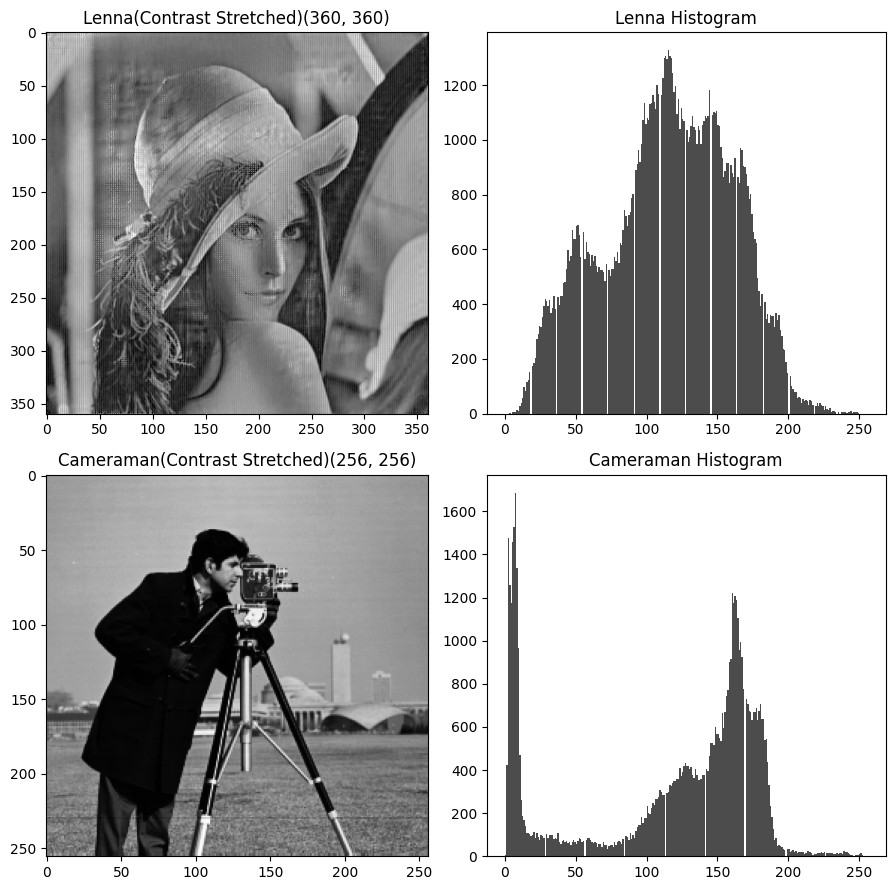

In [ ]:
def print_contrast_stretch_img():
    s = (2,2)
    plt.figure(figsize=(9,9))

    contrast1 = contrast_stretching(img1)
    contrast2 = contrast_stretching(img2)

    img_details('Lenna(Contrast Stretched)', contrast1, s, 1,cmap='gray')
    img_details('Cameraman(Contrast Stretched)', contrast2, s, 3, cmap='gray')

    plot_histogram(contrast1, 'Lenna Histogram', 2, s)
    plot_histogram(contrast2, 'Cameraman Histogram',4 , s)

    plt.tight_layout()
    plt.show()

print_contrast_stretch_img()

**SHIFTING(left,right)**

In [ ]:
def shift_left(img, shift_value=5):

    shifted = img-shift_value
    return shifted

def shift_right(img, shift_value=5):

    shifted = img+shift_value
    return shifted

In [ ]:
def scale_to_255(img):

    if np.max(img) <= 1:
        img = (img * 255).astype(np.uint8)

    return img

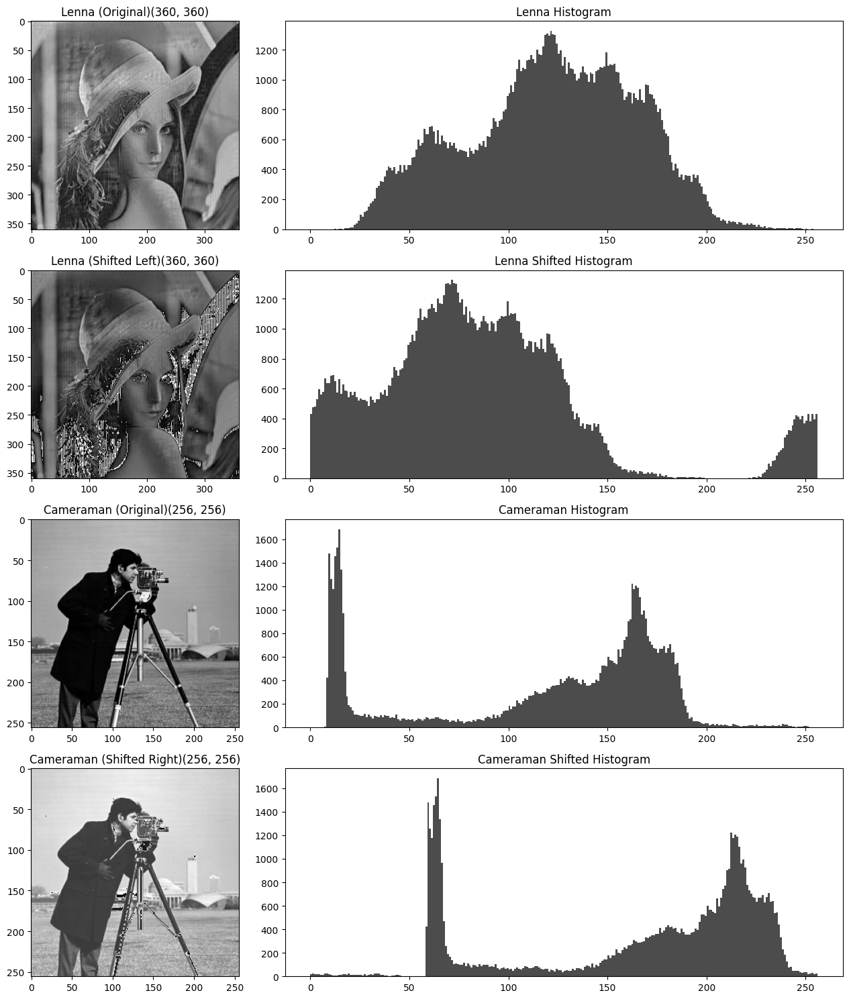

In [ ]:
def print_shift_img():
    s = (4,2)
    plt.figure(figsize=(15,15))

    shifted_left = shift_left(img1, shift_value=50)
    shifted_right1 = shift_right(img2, shift_value=50)

    img_details('Lenna (Original)', img1, s, 1, cmap='gray')
    img_details('Lenna (Shifted Left)', shifted_left, s, 3, cmap='gray')
    img_details('Cameraman (Original)', img2, s, 5, cmap='gray')
    img_details('Cameraman (Shifted Right)', shifted_right1, s, 7, cmap='gray')

    plot_histogram(scale_to_255(img1), 'Lenna Histogram', 2, s)
    plot_histogram(scale_to_255(shifted_left), 'Lenna Shifted Histogram', 4, s)
    plot_histogram(scale_to_255(img2), 'Cameraman Histogram', 6, s)
    plot_histogram(scale_to_255(shifted_right1), 'Cameraman Shifted Histogram', 8, s)

    plt.tight_layout()
    plt.show()

print_shift_img()
